- requirement
    - gulim.ttc 파일
    - yolov3.cfg 파일
    - yolov3.weights 파일
    - test.jpg 이미지 파일

In [ ]:
import warnings
warnings.filterwarnings('ignore')

In [ ]:
 !pkg-config --modversion opencv

3.2.0


In [ ]:
!git clone https://github.com/JeongaSeol/PJT03_nutrients_service.git

Cloning into 'PJT03_nutrients_service'...
remote: Enumerating objects: 27, done.
remote: Counting objects: 100% (27/27), done.
remote: Compressing objects: 100% (25/25), done.
remote: Total 27 (delta 1), reused 27 (delta 1), pack-reused 0
Unpacking objects: 100% (27/27), done.


In [ ]:
import cv2
import numpy as np
from PIL import ImageFont, ImageDraw, Image

In [ ]:
# yolo load(openCV로 YOLO 사용)

net = cv2.dnn.readNet('yolov3_tiny_best.weights', 'yolov3_tiny.cfg')
classes = ['백미밥', '배추김치', '계란프라이', '스팸', '라면', '조미김']

layer_names = net.getLayerNames()
output_layers = [layer_names[i[0]-1] for i in net.getUnconnectedOutLayers()]
colors = np.random.uniform(0,255, size = (len(classes), 3))


In [ ]:
img_list = ['/content/PJT03_nutrients_service/test_img/test_1.jpg',
            '/content/PJT03_nutrients_service/test_img/test_2.jpg',
            '/content/PJT03_nutrients_service/test_img/test_3.jpg',
            '/content/PJT03_nutrients_service/test_img/test_4.jpg',
            '/content/PJT03_nutrients_service/test_img/test_5.jpg',
            '/content/PJT03_nutrients_service/test_img/test_6.jpg',
            '/content/PJT03_nutrients_service/test_img/test_7.jpg',
            '/content/PJT03_nutrients_service/test_img/test_8.jpg',
            '/content/PJT03_nutrients_service/test_img/test_9.jpg',
            '/content/PJT03_nutrients_service/test_img/test_10.jpg',
            '/content/PJT03_nutrients_service/test_img/test_11.jpg',
            '/content/PJT03_nutrients_service/test_img/test_12.jpg',
            '/content/PJT03_nutrients_service/test_img/test_13.jpg']


In [ ]:
for i, img_path in enumerate(img_list):
    print(i, img_path)

0 /content/PJT03_nutrients_service/test_img/test_1.jpg
1 /content/PJT03_nutrients_service/test_img/test_2.jpg
2 /content/PJT03_nutrients_service/test_img/test_3.jpg
3 /content/PJT03_nutrients_service/test_img/test_4.jpg
4 /content/PJT03_nutrients_service/test_img/test_5.jpg
5 /content/PJT03_nutrients_service/test_img/test_6.jpg
6 /content/PJT03_nutrients_service/test_img/test_7.jpg
7 /content/PJT03_nutrients_service/test_img/test_8.jpg
8 /content/PJT03_nutrients_service/test_img/test_9.jpg
9 /content/PJT03_nutrients_service/test_img/test_10.jpg
10 /content/PJT03_nutrients_service/test_img/test_11.jpg
11 /content/PJT03_nutrients_service/test_img/test_12.jpg
12 /content/PJT03_nutrients_service/test_img/test_13.jpg


In [ ]:
!rm test1.jpg test2.jpg test3.jpg test4.jpg test5.jpg test6.jpg

rm: cannot remove 'test1.jpg': No such file or directory
rm: cannot remove 'test2.jpg': No such file or directory
rm: cannot remove 'test3.jpg': No such file or directory
rm: cannot remove 'test4.jpg': No such file or directory
rm: cannot remove 'test5.jpg': No such file or directory
rm: cannot remove 'test6.jpg': No such file or directory


['조미김', '백미밥']


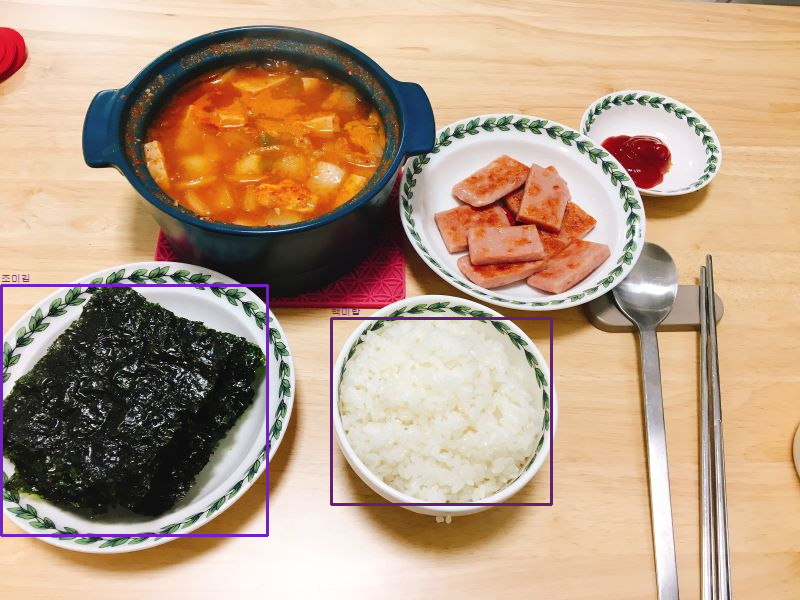

['스팸', '배추김치', '백미밥', '조미김']


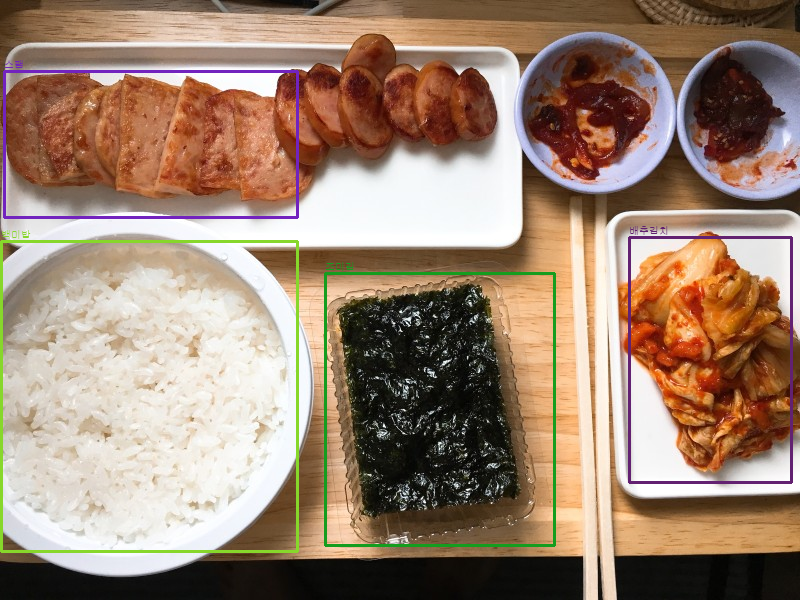

['조미김', '백미밥', '계란프라이']


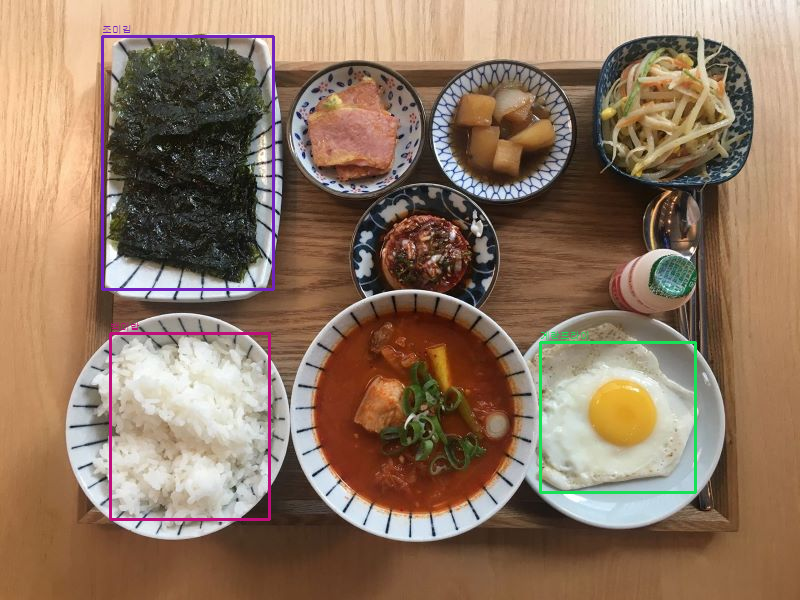

['라면', '배추김치']


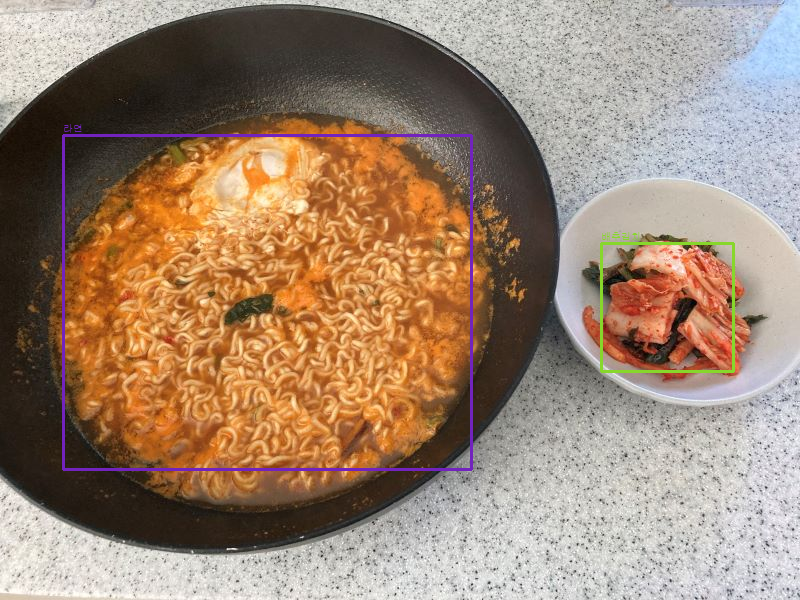

['라면']


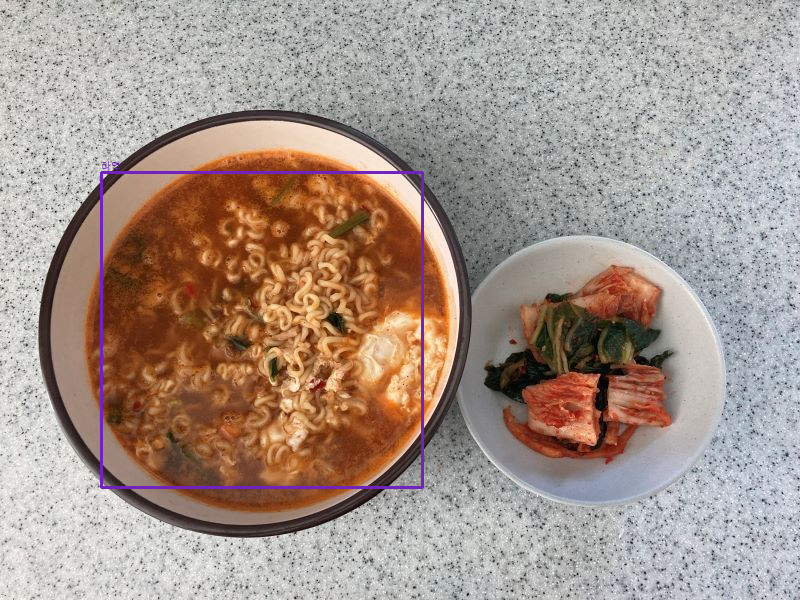

['라면']


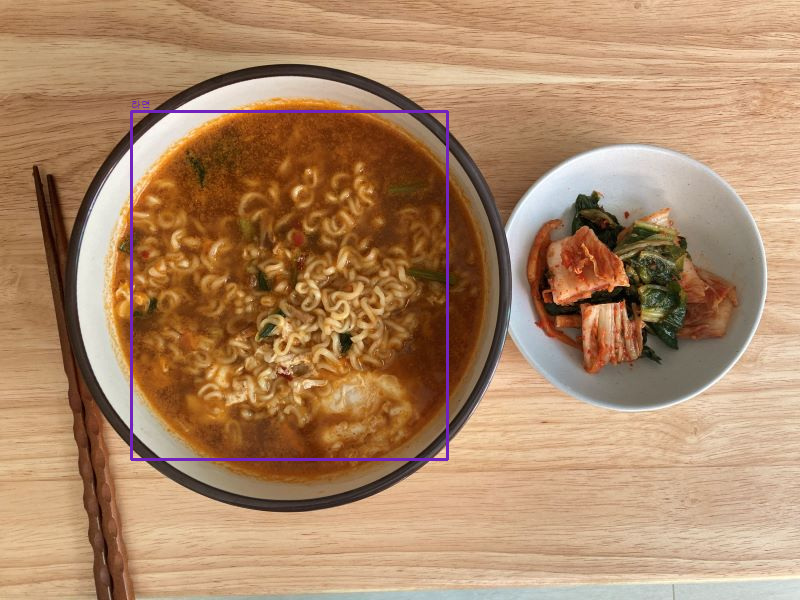

['계란프라이', '백미밥', '배추김치']


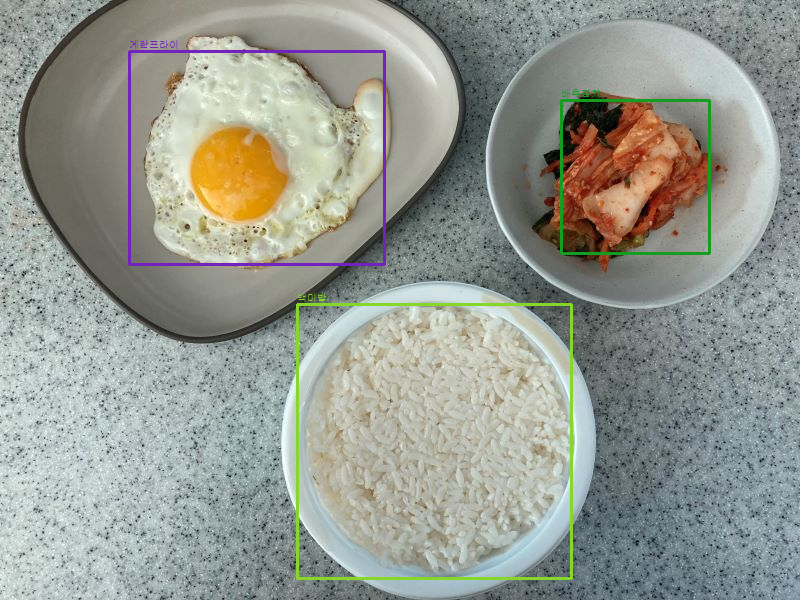

['계란프라이', '백미밥', '조미김', '배추김치']


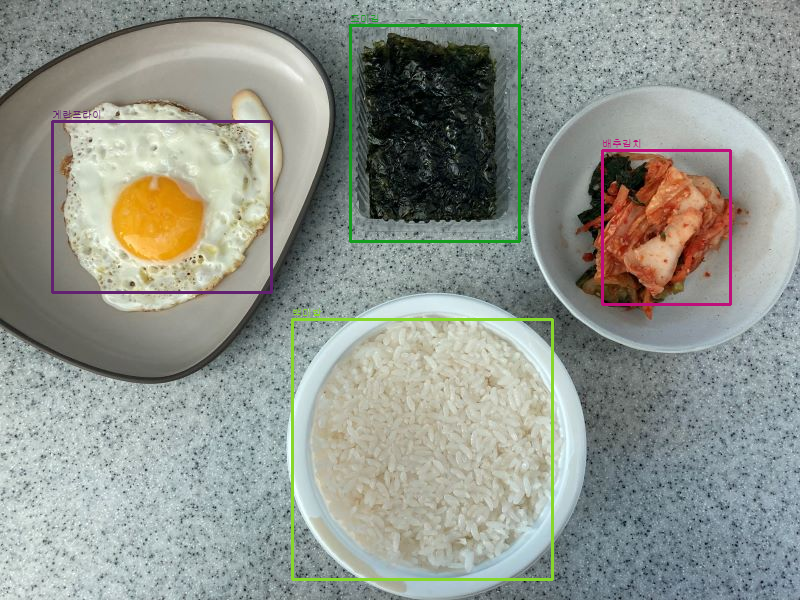

['배추김치', '계란프라이', '백미밥', '조미김']


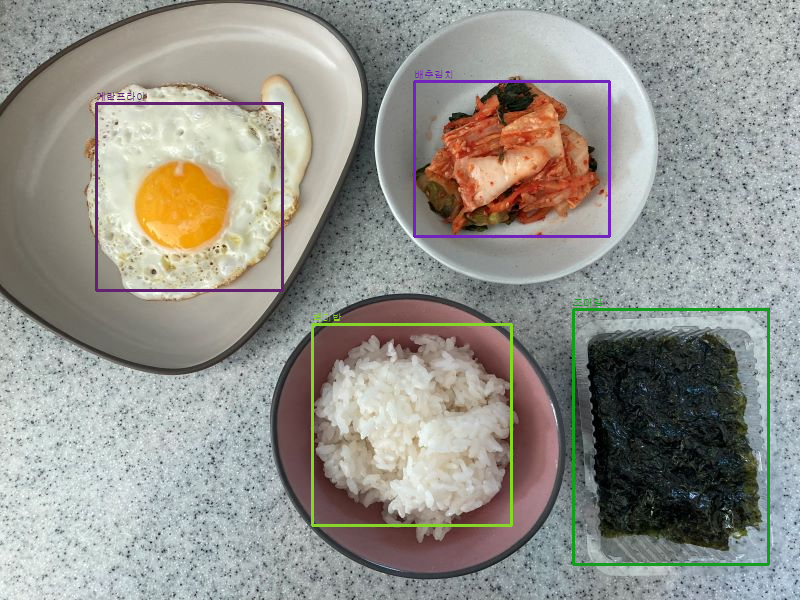

['계란프라이', '조미김', '배추김치']


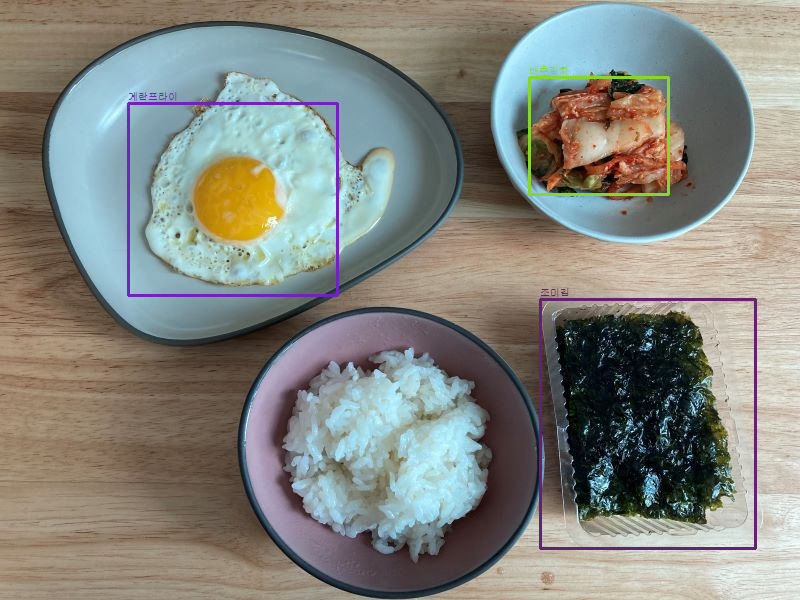

['백미밥', '조미김']


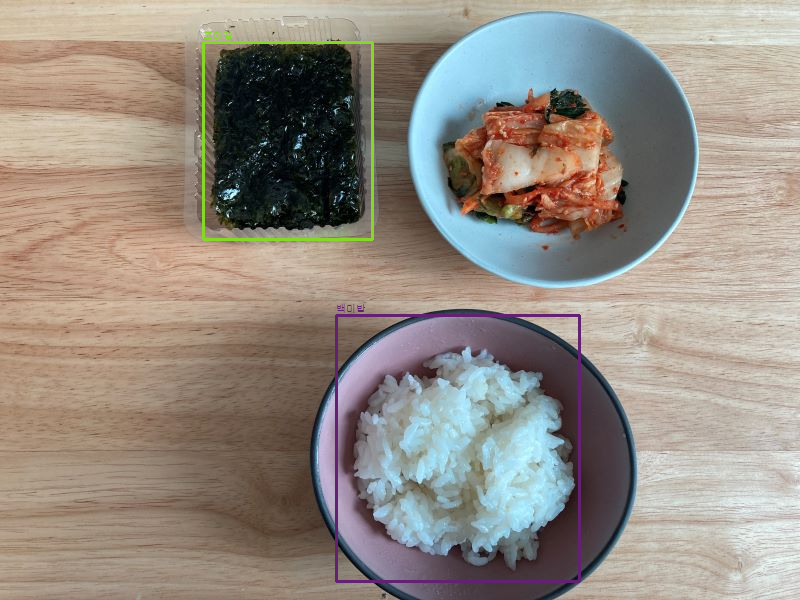

['배추김치', '계란프라이']


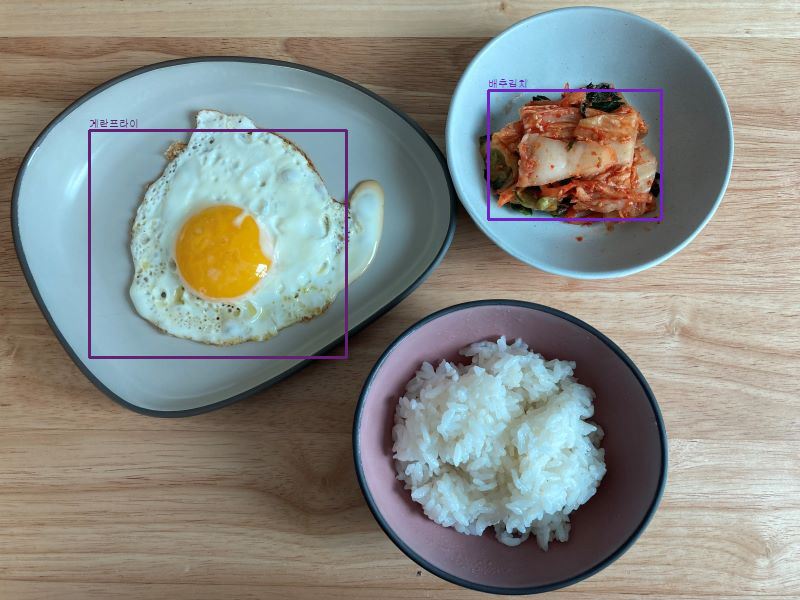

['조미김', '계란프라이']


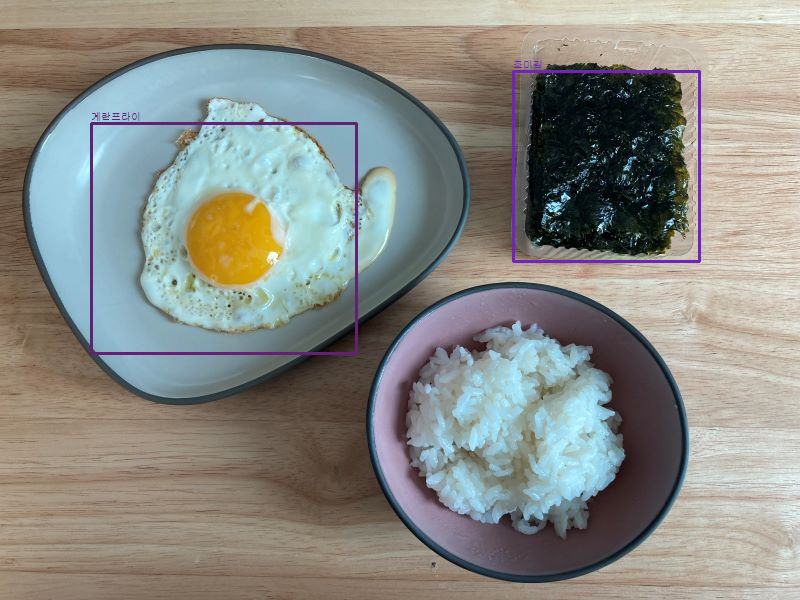

In [ ]:
for i, img_path in enumerate(img_list):
    # image load

    img = cv2.imread(img_path)
    # 이미지 resize로 40%로 축소. 정확도 떨어지지만 속도가 빠름. 
    # 속도나 정확성 보고 추후에 해당 코드를 추가할지 안할지 선택
    #img = cv2.resize(img, None, fx = 0.3, fy = 0.3) 

    height, width, channels = img.shape

    # objects detecting
    blob = cv2.dnn.blobFromImage(img, 0.00392, (416,416), (0,0,0), True, crop=False)
    net.setInput(blob)
    outs = net.forward(output_layers)

    # result print
    class_ids = []
    confidences = []
    boxes = []
    for out in outs:
        for detection in out:
            scores = detection[5:]
            class_id = np.argmax(scores)
            confidence = scores[class_id]
            if confidence > 0.5 :
                center_x = int(detection[0] * width)
                center_y = int(detection[1] * height)
                w = int(detection[2] * width)
                h = int(detection[3] * height)
                x = int(center_x - w/2)
                y = int(center_y - h/2)
                boxes.append([x,y,w,h])
                confidences.append(float(confidence))
                class_ids.append(class_id)

    #  중복박스 제거
    indexes = cv2.dnn.NMSBoxes(boxes, confidences, 0.5, 0.4)

    # 화면 출력
    #font = cv2.FONT_HERSHEY_COMPLEX_SMALL
    font=ImageFont.truetype("/content/PJT03_nutrients_service/yolov3_tiny/gulim.ttc",10)  # 한글 출력을 위해

    class_list = []
    x_list = []
    y_list = []
    color_use = []

    for i in range(len(boxes)):
        if i in indexes:
            x, y, w, h = boxes[i]
            label = str(classes[class_ids[i]])
            class_list.append(label)
            color = colors[i]
            color_use.append(color)
            x_list.append(x)        # 각각 x,y를 list형식으로 저장
            y_list.append(y)
            cv2.rectangle(img, (x,y), (x+w, y+h), color, 2) # 우선 검출된 객체를 box bounding 

    img = Image.fromarray(img) #img배열을 PIL이 처리가능하게 변환 
    draw = ImageDraw.Draw(img) 

    for i in range(len(x_list)):
        color = color_use[i]
        color_int = [int (j) for j in color]
        #draw.text((x_list[i], y_list[i]-12),str(classes[class_ids[i]]), font=font,fill=tuple(color_int)) #text를 출력 
        draw.text((x_list[i], y_list[i]-12),class_list[i], font=font,fill=tuple(color_int)) #text를 출력 
        #cv2.putText(img, label, (x, y+5), font,0.5, color, 3)

    # class_list => 검출된 class 목록 -> db에 저장? 
    print(class_list)

    img = np.array(img)
    from google.colab.patches import cv2_imshow

    img_name = 'test'+str(i+1)+'.jpg'
    # 이미지 출력 - 이부분은 나중에 이미지 저장해서 html로 보내주는 코드로 수정
    cv2_imshow(img)
    cv2.imwrite(img_name,img)
    cv2.waitKey(0)
    cv2.destroyAllWindows()